### Prepare dataset

In [ ]:
! pip install kaggle


In [ ]:
!mkdir -p ~/.kaggle
!mv kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json


In [ ]:
!ls -l ~/.kaggle/


total 4
-rw------- 1 root root 67 Apr  6 16:20 kaggle.json


In [ ]:
!kaggle datasets download -d iamprateek/wider-face-a-face-detection-dataset -p /content


Dataset URL: https://www.kaggle.com/datasets/iamtushara/face-detection-dataset
License(s): CC0-1.0
^C
unzip:  cannot find or open /content/face-detection-dataset.zip, /content/face-detection-dataset.zip.zip or /content/face-detection-dataset.zip.ZIP.


In [ ]:
import zipfile
import os

zip_path = "/content/wider-face-a-face-detection-dataset.zip"  # Update if needed
extract_to = "/content/WIDER"

# Unzip with progress
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_to)

print("✅ Dataset extracted successfully!")


✅ Dataset extracted successfully!


In [ ]:
dataset_path = "/content/WIDER"

print("📂 Dataset structure:")
for folder in os.listdir(dataset_path):
    print(" -", folder)


📂 Dataset structure:
 - WIDER_test
 - WIDER_val
 - wider_face_annotations
 - WIDER_train


In [ ]:
!pip install opencv-python matplotlib numpy


### dataset setup

In [ ]:
from argparse import Namespace
#config.py
config=Namespace(TRAIN_IMG_DIR="/content/WIDER/WIDER_train/WIDER_train/images",
                 TRAIN_IMG_ANNOTATION="/content/WIDER/wider_face_annotations/wider_face_split/wider_face_train_bbx_gt.txt",
                 VAL_IMG_DIR="/content/WIDER/WIDER_val/WIDER_val/images",
                 VAL_IMG_ANNOTATION="/content/WIDER/wider_face_annotations/wider_face_split/wider_face_val_bbx_gt.txt",
                 OUTPUT_DIR="/content/WIDER/working/data",
                 CLEANED_TRAIN_IMG_DIR="/content/WIDER/working/data/images/train",
                 CLEANED_VAL_IMG_DIR="/content/WIDER/working/data/images/val")

create subset

In [ ]:
import os
import shutil
import cv2
import numpy as np
import random
from tqdm import tqdm

# Ensure config is defined or imported
try:
    import config  # Ensure you have a config.py with necessary paths
except ImportError:
    print("Error: config module not found. Ensure it is defined with the required paths.")

# Function to organize dataset with subset selection
def organizing_data(img_dir, img_annotation_file, data_dir, split, subset_percentage=0.25):
    if not os.path.exists(img_annotation_file):
        print(f"Error: Annotation file {img_annotation_file} not found.")
        return

    image_file_index = []
    with open(img_annotation_file, 'r') as f:
        bbox_annotation = f.readlines()

    # Extract indices of images
    for index, line in enumerate(bbox_annotation):
        if line.strip().lower().endswith(".jpg"):
            image_file_index.append(index)

    print(f"\nOrganizing {split} Data...\n")
    skipped_images = []  # To store skipped images for debugging

    # Randomly select 25% of the images (based on their indices)
    total_images = len(image_file_index)
    selected_indices = random.sample(range(total_images), int(total_images * subset_percentage))

    # Sort selected indices for sequential processing (optional but useful for clarity)
    selected_indices.sort()

    for i in tqdm(range(len(selected_indices))):
        img_index = selected_indices[i]
        img_filename = bbox_annotation[image_file_index[img_index]].strip()
        img_name = os.path.basename(img_filename)
        annot_filename = os.path.splitext(img_name)[0] + ".txt"

        img_pth = os.path.join(img_dir, img_filename)
        new_img_pth = os.path.join(data_dir, "images", split, img_name)
        annot_file_pth = os.path.join(data_dir, "labels", split, annot_filename)

        # Ensure the destination directories exist
        os.makedirs(os.path.dirname(new_img_pth), exist_ok=True)
        os.makedirs(os.path.dirname(annot_file_pth), exist_ok=True)

        # Load image and check validity
        img = cv2.imread(img_pth)
        if img is None:
            print(f"Warning: Could not read image {img_pth}. Skipping...")
            skipped_images.append(img_name)
            continue

        # Extract bounding boxes
        start = image_file_index[img_index] + 2
        end = image_file_index[img_index + 1] if img_index + 1 < len(image_file_index) else len(bbox_annotation)
        boxes = bbox_annotation[start:end]

        # Save the selected image and annotations
        shutil.copy(img_pth, new_img_pth)  # Copy image to the new directory
        np.savetxt(annot_file_pth, boxes, fmt="%s", delimiter=",")  # Save annotations

    # Print out skipped images for debugging
    if skipped_images:
        print(f"\nSkipped images due to read errors: {skipped_images}\n")

# Organize training and validation data
organizing_data(config.TRAIN_IMG_DIR, config.TRAIN_IMG_ANNOTATION, config.OUTPUT_DIR, split="train")
organizing_data(config.VAL_IMG_DIR, config.VAL_IMG_ANNOTATION, config.OUTPUT_DIR, split="val")


Error: config module not found. Ensure it is defined with the required paths.

Organizing train Data...



100%|██████████| 3220/3220 [00:26<00:00, 121.14it/s]



Organizing val Data...



100%|██████████| 806/806 [00:06<00:00, 132.12it/s]


In [ ]:
import os
import shutil
import cv2
import numpy as np
from tqdm import tqdm

# Ensure config is defined or imported
try:
    import config  # Ensure you have a config.py with necessary paths
except ImportError:
    print("Error: config module not found. Ensure it is defined with the required paths.")

# Function to organize dataset
def organizing_data(img_dir, img_annotation_file, data_dir, split):
    if not os.path.exists(img_annotation_file):
        print(f"Error: Annotation file {img_annotation_file} not found.")
        return

    image_file_index = []
    with open(img_annotation_file, 'r') as f:
        bbox_annotation = f.readlines()

    # Extract indices of images
    for index, line in enumerate(bbox_annotation):
        if line.strip().lower().endswith(".jpg"):
            image_file_index.append(index)

    print(f"\nOrganizing {split} Data...\n")
    skipped_images = []  # To store skipped images for debugging

    for i in tqdm(range(len(image_file_index))):
        img_filename = bbox_annotation[image_file_index[i]].strip()
        img_name = os.path.basename(img_filename)
        annot_filename = os.path.splitext(img_name)[0] + ".txt"

        img_pth = os.path.join(img_dir, img_filename)
        new_img_pth = os.path.join(data_dir, "images", split, img_name)
        annot_file_pth = os.path.join(data_dir, "labels", split, annot_filename)

        # Ensure the destination directories exist
        os.makedirs(os.path.dirname(new_img_pth), exist_ok=True)
        os.makedirs(os.path.dirname(annot_file_pth), exist_ok=True)

        # Load image and check validity
        img = cv2.imread(img_pth)
        if img is None:
            print(f"Warning: Could not read image {img_pth}. Skipping...")
            skipped_images.append(img_name)
            continue

        # Extract bounding boxes
        start = image_file_index[i] + 2
        end = image_file_index[i + 1] if i + 1 < len(image_file_index) else len(bbox_annotation)
        boxes = bbox_annotation[start:end]

        # Save all bounding boxes without validation
        shutil.copy(img_pth, new_img_pth)  # Copy image to the new directory
        np.savetxt(annot_file_pth, boxes, fmt="%s", delimiter=",")  # Save annotations

    # Print out skipped images for debugging
    if skipped_images:
        print(f"\nSkipped images due to read errors: {skipped_images}\n")

# Organize training and validation data
organizing_data(config.TRAIN_IMG_DIR, config.TRAIN_IMG_ANNOTATION, config.OUTPUT_DIR, split="train")
organizing_data(config.VAL_IMG_DIR, config.VAL_IMG_ANNOTATION, config.OUTPUT_DIR, split="val")


Error: config module not found. Ensure it is defined with the required paths.

Organizing train Data...



100%|██████████| 12880/12880 [01:44<00:00, 123.42it/s]



Organizing val Data...



100%|██████████| 3226/3226 [00:24<00:00, 130.58it/s]


In [ ]:
import os

def count_images_in_folder(folder_path, file_extension=".jpg"):
    """Count the number of image files in a folder"""
    image_count = 0
    for dirpath, dirnames, filenames in os.walk(folder_path):
        for filename in filenames:
            if filename.lower().endswith(file_extension):  # Check if file is an image
                image_count += 1
    return image_count

# Paths to the original and new folders
original_folder = config.TRAIN_IMG_DIR  # Original folder where files were moved from
new_folder = config.CLEANED_TRAIN_IMG_DIR  # New folder where files were copied to

# Count the number of images
original_image_count = count_images_in_folder(original_folder)
new_image_count = count_images_in_folder(new_folder)

# Print the number of images
print(f"Original Folder Image Count: {original_image_count}")
print(f"New Folder Image Count: {new_image_count}")

# Compare the number of images
if original_image_count == new_image_count:
    print("The number of images in the original and new folders is the same.")
else:
    image_diff = original_image_count - new_image_count
    print(f"The new folder has {'more' if image_diff < 0 else 'fewer'} images by {abs(image_diff)} images.")


Original Folder Image Count: 12880
New Folder Image Count: 12880
The number of images in the original and new folders is the same.


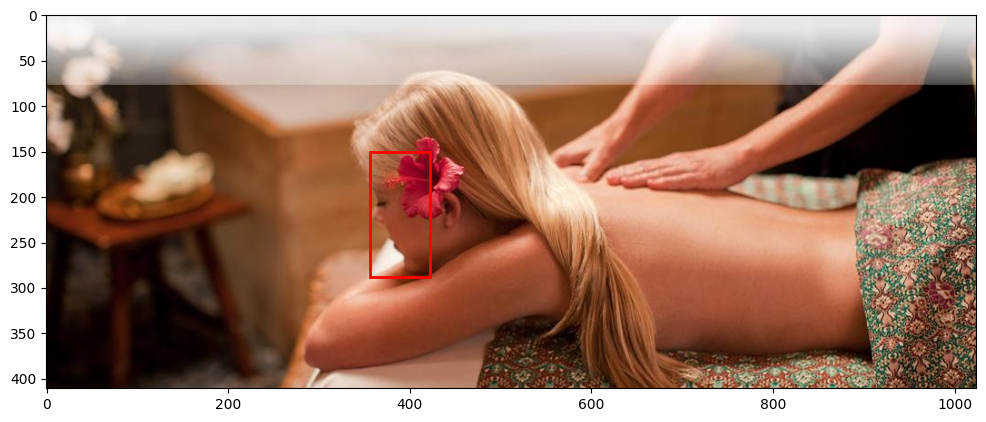

In [ ]:
import cv2
import numpy as np
import random
import matplotlib.pyplot as plt
from matplotlib import patches
import os

# Function to display a random image with bounding boxes
def display_random_image_with_bboxes(img_dir, annot_dir):
    # List all the images in the directory
    img_files = [f for f in os.listdir(img_dir) if f.endswith('.jpg')]

    if not img_files:
        print(f"Error: No images found in the directory {img_dir}.")
        return

    # Choose a random image
    img_file = random.choice(img_files)
    img_pth = os.path.join(img_dir, img_file)

    # Read the image
    img = cv2.imread(img_pth)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert from BGR to RGB

    # Read the corresponding annotation file
    annot_file = os.path.join(annot_dir, img_file[:-4] + ".txt")  # Correct annotation file path

    # Check if the annotation file exists
    if not os.path.exists(annot_file):
        print(f"Error: Annotation file {annot_file} not found.")
        return

    # Load the bounding boxes from the annotation file
    try:
        with open(annot_file, "r") as f:
            lines = f.readlines()

        # Extract only the first four values (x, y, w, h) and ignore the rest
        bboxes = []
        for line in lines:
            values = line.strip().split()
            if len(values) >= 4:  # Ensure at least 4 values exist
                x, y, w, h = map(float, values[:4])
                bboxes.append([x, y, w, h])

        bboxes = np.array(bboxes)

    except Exception as e:
        print(f"Error reading annotation file {annot_file}: {e}")
        return

    # Create a plot to display the image
    fig, ax = plt.subplots(1, figsize=(12, 8))
    ax.imshow(img)

    # Plot the bounding boxes
    for bbox in bboxes:
        x, y, w, h = bbox
        rect = patches.Rectangle((x, y), w, h, linewidth=2, edgecolor='r', facecolor='none')
        ax.add_patch(rect)

    plt.show()

# Correct the path to the image directory and annotation directory
display_random_image_with_bboxes(config.CLEANED_TRAIN_IMG_DIR, "/content/WIDER/working/data/labels/train")


###Conversion to Yolo LABELS

In [ ]:
import os
from PIL import Image

def convert_wider_to_yolo(config):
    # Process train and val splits
    for split in ["train", "val"]:
        img_dir = getattr(config, f"CLEANED_{split.upper()}_IMG_DIR")  # Fix typo: CLEANED -> CLEANED
        label_dir = f"/content/WIDER/working/data/labels/{split}"
        os.makedirs(label_dir, exist_ok=True)

        # Load and preprocess annotation file
        annotation_path = getattr(config, f"TRAIN_IMG_ANNOTATION" if split == "train" else "VAL_IMG_ANNOTATION")
        with open(annotation_path, 'r') as f:
            # Filter out comments and empty lines
            lines = [line.strip() for line in f if line.strip() and not line.startswith('#')]

        i = 0
        while i < len(lines):
            # Extract image name and move to num_faces line
            try:
                img_name = lines[i]
                base_name = os.path.basename(img_name)
                i += 1  # Move to num_faces line
            except IndexError:
                break

            # Validate num_faces line
            try:
                num_faces = int(lines[i])
                i += 1  # Move to first face annotation
            except (ValueError, IndexError):
                print(f"Skipping invalid num_faces at line {i}: {lines[i]}")
                i += 1
                continue

            # Get image dimensions
            img_path = os.path.join(img_dir, base_name)
            if not os.path.exists(img_path):
                print(f"Skipping missing image: {img_path}")
                i += num_faces  # Skip face annotations
                continue

            try:
                with Image.open(img_path) as img:
                    img_w, img_h = img.size
            except Exception as e:
                print(f"Error opening {img_path}: {str(e)}")
                i += num_faces
                continue

            # Process face annotations
            yolo_lines = []
            valid_faces = 0
            for _ in range(num_faces):
                if i >= len(lines):
                    break

                # Check if we've hit next image entry accidentally
                if "--" in lines[i] and "/" in lines[i]:  # Heuristic for filename
                    break

                try:
                    ann = list(map(int, lines[i].split()))
                    x, y, w, h = ann[0], ann[1], ann[2], ann[3]

                    # Validate coordinates
                    if w <= 0 or h <= 0:
                        raise ValueError

                    # Convert to YOLO format
                    x_center = (x + w/2) / img_w
                    y_center = (y + h/2) / img_h
                    width = w / img_w
                    height = h / img_h

                    yolo_lines.append(f"0 {x_center:.6f} {y_center:.6f} {width:.6f} {height:.6f}")
                    valid_faces += 1
                    i += 1
                except (ValueError, IndexError):
                    print(f"Skipping invalid annotation in {img_name}: {lines[i]}")
                    i += 1

            # Save labels only if valid faces exist
            if valid_faces > 0:
                label_path = os.path.join(label_dir, f"{os.path.splitext(base_name)[0]}.txt")
                with open(label_path, 'w') as f:
                    f.write("\n".join(yolo_lines))
            else:
                print(f"No valid faces found for {img_name}")

# Run conversion
convert_wider_to_yolo(config)

No valid faces found for 0--Parade/0_Parade_Parade_0_452.jpg
Skipping invalid num_faces at line 10424: 0--Parade/0_Parade_Parade_0_630.jpg
Skipping invalid num_faces at line 10426: 20 186 14 20 1 0 0 0 0 0
Skipping invalid num_faces at line 10428: 119 181 14 17 2 0 0 0 2 0
Skipping invalid num_faces at line 10430: 375 129 46 62 0 0 0 0 0 0
Skipping invalid num_faces at line 10432: 349 122 26 38 0 0 0 0 0 0
Skipping invalid num_faces at line 10434: 527 174 10 16 1 0 0 0 0 0
Skipping invalid num_faces at line 10436: 695 143 49 64 0 0 0 0 0 0
Skipping invalid num_faces at line 10438: 822 138 29 38 0 0 0 0 2 0
Skipping invalid num_faces at line 10440: 954 156 12 18 1 0 0 0 0 0
Skipping invalid num_faces at line 10442: 615 143 22 24 1 0 0 0 2 0
Skipping invalid annotation in 12--Group/12_Group_Large_Group_12_Group_Large_Group_12_31.jpg: 530 178 0 1 2 0 0 0 1 0
Skipping invalid annotation in 2--Demonstration/2_Demonstration_Demonstration_Or_Protest_2_666.jpg: 700 260 0 0 2 0 0 0 0 0
Skipping

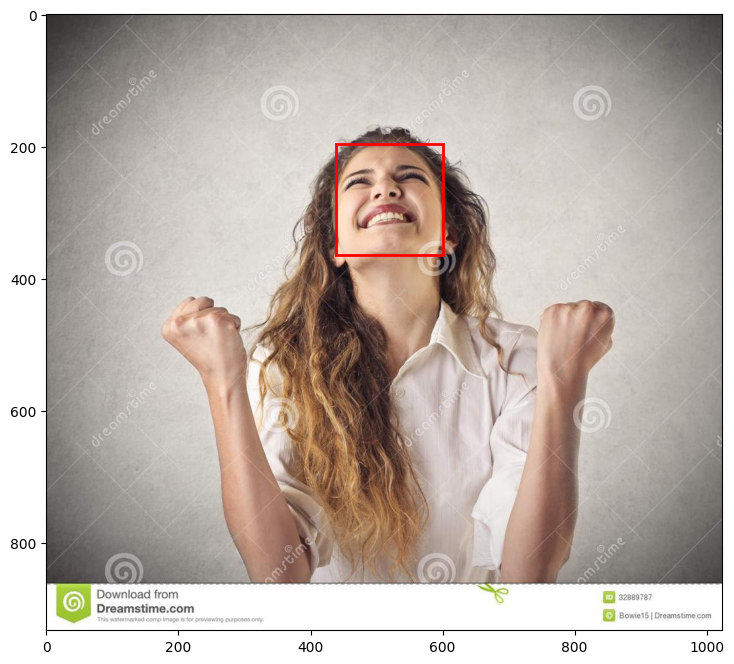

In [ ]:
import cv2
import numpy as np
import random
import matplotlib.pyplot as plt
from matplotlib import patches
import os

def display_random_image_with_bboxes(img_dir, annot_dir):
    img_files = [f for f in os.listdir(img_dir) if f.endswith('.jpg')]
    if not img_files:
        print(f"Error: No images found in the directory {img_dir}.")
        return

    img_file = random.choice(img_files)
    img_pth = os.path.join(img_dir, img_file)

    img = cv2.imread(img_pth)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert from BGR to RGB
    h, w, _ = img.shape  # Get image dimensions

    annot_file = os.path.join(annot_dir, img_file[:-4] + ".txt")
    if not os.path.exists(annot_file):
        print(f"Error: Annotation file {annot_file} not found.")
        return

    try:
        with open(annot_file, "r") as f:
            lines = f.readlines()

        bboxes = []
        for line in lines:
            values = line.strip().split()
            if len(values) >= 5:  # YOLO format: class_id x_center y_center width height
                _, x_center, y_center, box_w, box_h = map(float, values)

                # Convert normalized values back to pixel coordinates
                x = (x_center - box_w / 2) * w
                y = (y_center - box_h / 2) * h
                width = box_w * w
                height = box_h * h

                bboxes.append([x, y, width, height])

        bboxes = np.array(bboxes)
    except Exception as e:
        print(f"Error reading annotation file {annot_file}: {e}")
        return

    fig, ax = plt.subplots(1, figsize=(12, 8))
    ax.imshow(img)

    for bbox in bboxes:
        x, y, width, height = bbox
        rect = patches.Rectangle((x, y), width, height, linewidth=2, edgecolor='r', facecolor='none')
        ax.add_patch(rect)

    plt.show()

display_random_image_with_bboxes(config.CLEANED_TRAIN_IMG_DIR, "/content/WIDER/working/data/labels/train")

### import YOLO model

In [ ]:
pip install torch torchvision


In [ ]:
pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 993.8/993.8 kB 39.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 94.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 72.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 42.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 11.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 55.1 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstall

In [ ]:
from ultralytics import YOLO

# Load model (choose one)
#model = YOLO("yolov9c.pt")
#print(model)



Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [ ]:
dataset_yaml = """
train: /content/WIDER/working/data/images/train  # Path to training images
val: /content/WIDER/working/data/images/val     # Path to validation images

nc: 1  # Number of classes
names: ['face']  # Class names
"""

# Save the content to a YAML file
with open('/content/dataset.yaml', 'w') as f:
    f.write(dataset_yaml)


### mount drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


### train model and save weights in drive

In [ ]:
# Recover weights from Google Drive
!cp /content/drive/MyDrive/model2.0.pt /content/model2.0.pt

In [6]:
from ultralytics import YOLO

# Define save path in Google Drive
save_path = "/content/drive/MyDrive/yolo_weights"

# Train model & store results in Google Drive
#model.train(data='/content/dataset.yaml', epochs=100, batch=8, imgsz=512, project=save_path, name="yolo_run", save_period=4)
model = YOLO('/content/model2.0.pt')
model.train(
        data='/content/dataset.yaml',
        resume=False,
        epochs=30,
        imgsz=512,
        batch=10,
        lr0=0.005,
        lrf=0.0005,
        momentum=0.937,
        weight_decay=0.0005,
        optimizer="AdamW",
        box=0.05,
        cls=0.5,
        dfl=1.5,
        hsv_h=0.015,
        hsv_s=0.7,
        hsv_v=0.4,
        fliplr=0.5,
        mosaic=0.7,
        mixup=0.2,
        scale=0.7,
        translate=0.2,
        perspective=0.0001,
        patience=15,
        project=save_path,
        name="phase1.2",
        save_period=4
    )


#model.train(data='/content/dataset.yaml', epochs=100, batch=8, imgsz=512)
#8   640

#!cp /content/runs/train/exp/weights/last.pt /content/drive/MyDrive/yolo_last.pt

Ultralytics 8.3.102 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=/content/model2.0.pt, data=/content/dataset.yaml, epochs=30, time=None, patience=15, batch=10, imgsz=512, save=True, save_period=4, cache=False, device=None, workers=8, project=/content/drive/MyDrive/yolo_weights, name=phase1.25, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_

###recover weights


In [ ]:
import torch
print("GPU Available:", torch.cuda.is_available())
print("Device:", torch.cuda.get_device_name(0) if torch.cuda.is_available() else "CPU")


GPU Available: True
Device: Tesla T4


In [ ]:
from ultralytics import YOLO
# Recover weights from Google Drive
!cp /content/drive/MyDrive/model1.0.pt /content/model1.0.pt

# Define save path in Google Drive
save_path = "/content/drive/MyDrive/yolo_weights"

# Load model and resume training
model = YOLO('/content/model1.0.pt')


In [ ]:
# Resume training from the last checkpoint
model.train(resume=True,data='/content/dataset.yaml', project=save_path, name="yolo_run", save_period=4)

Ultralytics 8.3.102 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=/content/model1.0.pt, data=/content/dataset.yaml, epochs=25, time=None, patience=15, batch=10, imgsz=512, save=True, save_period=4, cache=False, device=None, workers=8, project=/content/drive/MyDrive/yolo_weights, name=yolo_run2, exist_ok=False, pretrained=True, optimizer=sgd, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=/content/model1.0.pt, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_cro

100%|██████████| 755k/755k [00:00<00:00, 95.1MB/s]


TensorBoard: Start with 'tensorboard --logdir /content/drive/MyDrive/yolo_weights/yolo_run2', view at http://localhost:6006/

                   from  n    params  module                                       arguments                     
  0                  -1  1      1392  ultralytics.nn.modules.conv.Conv             [3, 48, 3, 2]                 
  1                  -1  1     41664  ultralytics.nn.modules.conv.Conv             [48, 96, 3, 2]                
  2                  -1  2    111360  ultralytics.nn.modules.block.C2f             [96, 96, 2, True]             
  3                  -1  1    166272  ultralytics.nn.modules.conv.Conv             [96, 192, 3, 2]               
  4                  -1  4    813312  ultralytics.nn.modules.block.C2f             [192, 192, 4, True]           
  5                  -1  1    664320  ultralytics.nn.modules.conv.Conv             [192, 384, 3, 2]              
  6                  -1  4   3248640  ultralytics.nn.modules.block.C2f      

100%|██████████| 5.35M/5.35M [00:00<00:00, 337MB/s]


AMP: checks passed ✅


train: Scanning /content/WIDER/working/data/labels/train... 12880 images, 0 backgrounds, 8 corrupt: 100%|██████████| 12880/12880 [00:37<00:00, 345.82it/s]

train: WARNING ⚠️ /content/WIDER/working/data/images/train/0_Parade_Parade_0_452.jpg: ignoring corrupt image/label: cannot reshape array of size 9 into shape (2)
train: WARNING ⚠️ /content/WIDER/working/data/images/train/0_Parade_Parade_0_630.jpg: ignoring corrupt image/label: cannot reshape array of size 9 into shape (2)
train: WARNING ⚠️ /content/WIDER/working/data/images/train/2_Demonstration_Political_Rally_2_414.jpg: ignoring corrupt image/label: cannot reshape array of size 9 into shape (2)
train: WARNING ⚠️ /content/WIDER/working/data/images/train/2_Demonstration_Political_Rally_2_444.jpg: ignoring corrupt image/label: cannot reshape array of size 9 into shape (2)
train: WARNING ⚠️ /content/WIDER/working/data/images/train/2_Demonstration_Protesters_2_231.jpg: 1 duplicate labels removed
train: WARNING ⚠️ /content/WIDER/working/data/images/train/37_Soccer_Soccer_37_851.jpg: 1 duplicate labels removed
train: WARNING ⚠️ /content/WIDER/working/data/images/train/39_Ice_Skating_iceskii

train: New cache created: /content/WIDER/working/data/labels/train.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /content/WIDER/working/data/labels/val... 3226 images, 0 backgrounds, 4 corrupt: 100%|██████████| 3226/3226 [00:08<00:00, 367.00it/s]

val: WARNING ⚠️ /content/WIDER/working/data/images/val/0_Parade_Parade_0_275.jpg: ignoring corrupt image/label: cannot reshape array of size 9 into shape (2)
val: WARNING ⚠️ /content/WIDER/working/data/images/val/21_Festival_Festival_21_604.jpg: 1 duplicate labels removed
val: WARNING ⚠️ /content/WIDER/working/data/images/val/37_Soccer_soccer_ball_37_281.jpg: ignoring corrupt image/label: cannot reshape array of size 9 into shape (2)
val: WARNING ⚠️ /content/WIDER/working/data/images/val/50_Celebration_Or_Party_houseparty_50_715.jpg: ignoring corrupt image/label: cannot reshape array of size 9 into shape (2)
val: WARNING ⚠️ /content/WIDER/working/data/images/val/7_Cheering_Cheering_7_426.jpg: ignoring corrupt image/label: cannot reshape array of size 9 into shape (2)
val: New cache created: /content/WIDER/working/data/labels/val.cache


Plotting labels to /content/drive/MyDrive/yolo_weights/yolo_run2/labels.jpg... 
optimizer: SGD(lr=0.01, momentum=0.937) with parameter groups 77 weight(decay=0.0), 84 weight(decay=0.00046875), 83 bias(decay=0.0)
Resuming training /content/model1.0.pt from epoch 25 to 25 total epochs
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
TensorBoard: model graph visualization added ✅
Image sizes 512 train, 512 val
Using 2 dataloader workers
Logging results to /content/drive/MyDrive/yolo_weights/yolo_run2
Starting training for 25 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/25      9.34G   0.008881     0.5873     0.9838          4        512: 100%|██████████| 1288/1288 [05:15<00:00,  4.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 162/162 [00:49<00:00,  3.29it/s]


                   all       3222      39696      0.843      0.557      0.635      0.352

1 epochs completed in 0.104 hours.
Optimizer stripped from /content/drive/MyDrive/yolo_weights/yolo_run2/weights/last.pt, 52.0MB
Optimizer stripped from /content/drive/MyDrive/yolo_weights/yolo_run2/weights/best.pt, 52.0MB

Validating /content/drive/MyDrive/yolo_weights/yolo_run2/weights/best.pt...
Ultralytics 8.3.102 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 92 layers, 25,840,339 parameters, 0 gradients, 78.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 162/162 [00:43<00:00,  3.71it/s]


                   all       3222      39696      0.842      0.557      0.635      0.352
Speed: 0.1ms preprocess, 4.4ms inference, 0.0ms loss, 1.5ms postprocess per image
Results saved to /content/drive/MyDrive/yolo_weights/yolo_run2


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7c47f9334350>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.048048, 

### fine tune

In [ ]:
from ultralytics import YOLO
# Recover weights from Google Drive
!cp /content/drive/MyDrive/yolo_weights/yolo_run/weights/last.pt /content/last.pt

# Define save path in Google Drive
save_path = "/content/drive/MyDrive/yolo_weights"



In [10]:
model.train(
    resume=False,
    model="/content/last.pt",  # specify the checkpoint to load weights from
    data="/content/dataset.yaml",
    epochs=20,
    batch=8,
    imgsz=512,
    optimizer="SGD",
    save_period=4,
    cos_lr=True,
    lr0=0.001,
    lrf=0.001,
    warmup_epochs=5.0,
    project=save_path,
    name="yolo_run_updated"
)


Ultralytics 8.3.102 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=/content/model2.0.pt, data=/content/dataset.yaml, epochs=30, time=None, patience=15, batch=10, imgsz=512, save=True, save_period=4, cache=False, device=None, workers=8, project=/content/drive/MyDrive/yolo_weights, name=phase1.25, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_

### Testing

In [ ]:
from ultralytics import YOLO


# Load the trained model
model = YOLO('/content/facial_detection.pt')  # Path to your trained model

img_path = '/content/worlds-largest-selfie.jpg'
# Predict on the image
results = model.predict(img_path)

# Display the image with predictions (Access first result in list)
results[0].show()




image 1/1 /content/worlds-largest-selfie.jpg: 384x640 300 faces, 49.9ms
Speed: 12.5ms preprocess, 49.9ms inference, 2.8ms postprocess per image at shape (1, 3, 384, 640)


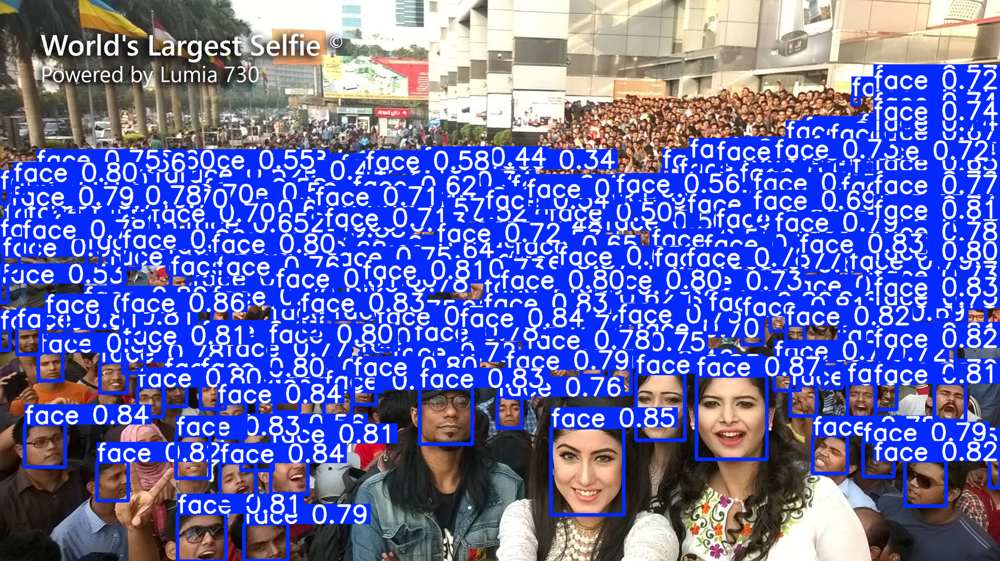

In [ ]:
# Predict on the image
results = model.predict(img_path)

# Display the image with predictions (Access first result in list)
results[0].show()



#EigenCAM

In [ ]:
from YOLOv8_Explainer import yolov8_heatmap, display_images

# Initialize the model with desired parameters
model = yolov8_heatmap(
    weight="/content/facial_detection.pt",  # Path to your YOLOv8 model
    conf_threshold=0.4,                      # Confidence threshold for detections
    method="EigenCAM",                       # CAM method: 'EigenCAM', 'LayerCAM', etc.
    layer=[10, 12, 14, 16, 18, -3],          # Layers to target for CAM
    show_box=True,                           # Whether to display bounding boxes
    renormalize=False                        # Whether to renormalize the heatmap
)



Model summary: 169 layers, 25,856,899 parameters, 0 gradients, 79.1 GFLOPs


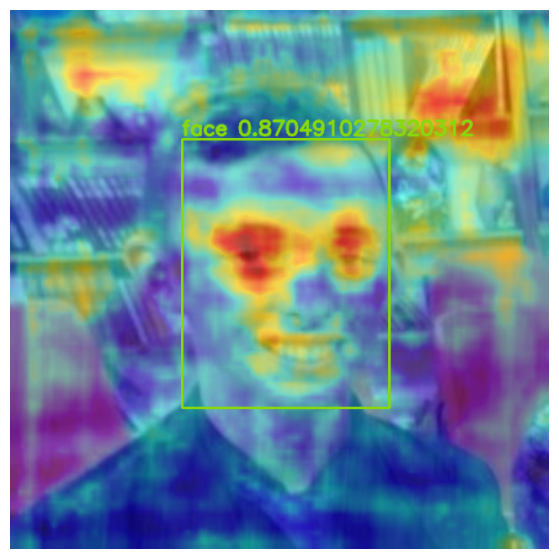

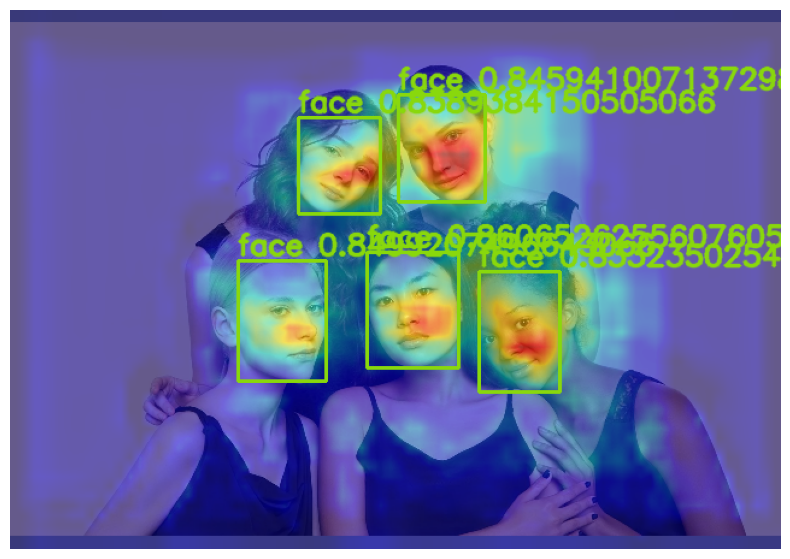

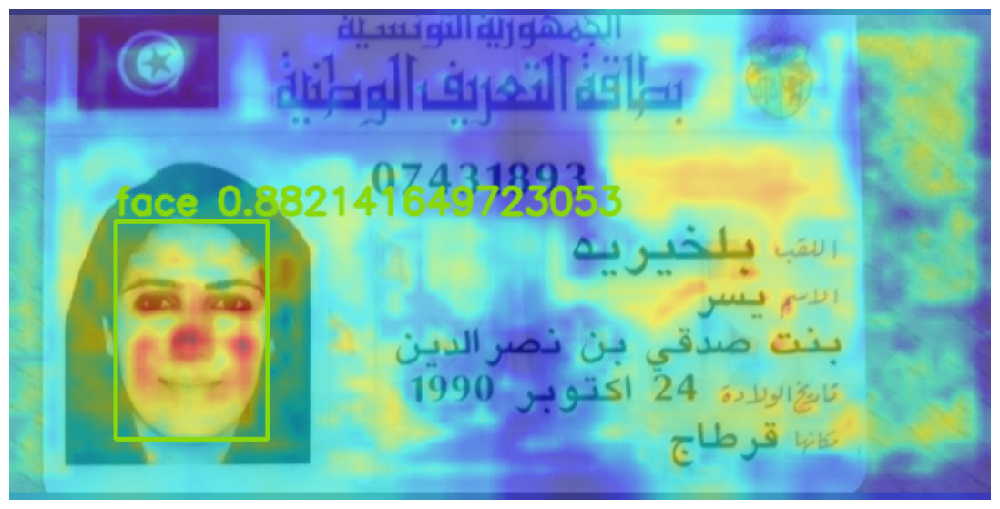

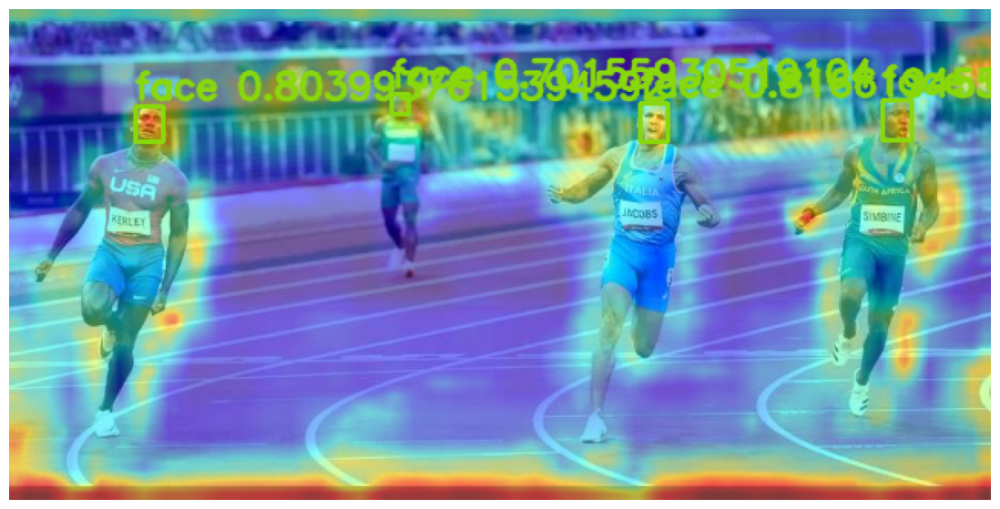

In [ ]:
# Apply the model to an image
images = model(img_path="/content/real_1008.jpg")

# Display the resulting images with heatmaps
display_images(images)
# Apply the model to an image
images = model(img_path="/content/169053377164c37f8bd24561.webp")

# Display the resulting images with heatmaps
display_images(images)
# Apply the model to an image
images = model(img_path="/content/8b4e6834-8981-4e2b-8576-c3f5e9a70242.jpg")

# Display the resulting images with heatmaps
display_images(images)
images = model(img_path="/content/top2c-460_x2.jpg")

# Display the resulting images with heatmaps
display_images(images)

#GradCAM

In [ ]:
from YOLOv8_Explainer import yolov8_heatmap, display_images

# Initialize the model with desired parameters
model = yolov8_heatmap(
    weight="/content/facial_detection.pt",  # Path to your YOLOv8 model
    conf_threshold=0.4,                      # Confidence threshold for detections
    method="GradCAM",                       # CAM method: 'EigenCAM', 'LayerCAM', etc.
    layer=[10, 12, 14, 16, 18, -3],          # Layers to target for CAM
    show_box=True,                           # Whether to display bounding boxes
    renormalize=False                        # Whether to renormalize the heatmap
)



Model summary: 169 layers, 25,856,899 parameters, 0 gradients, 79.1 GFLOPs


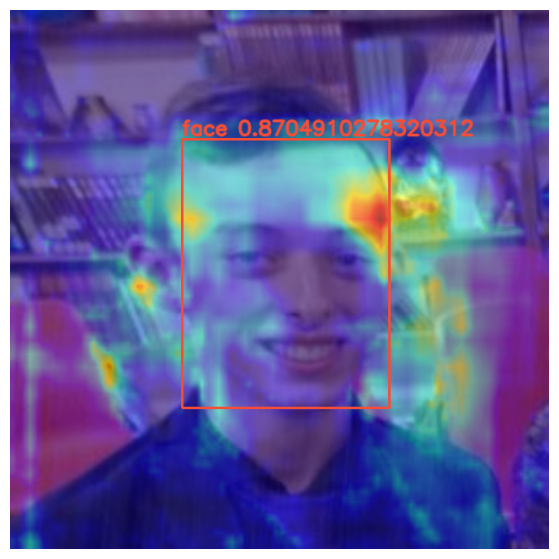

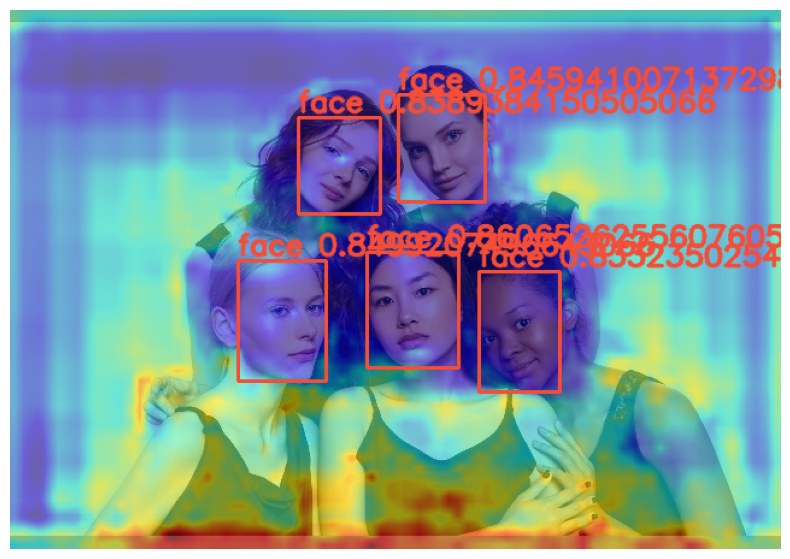

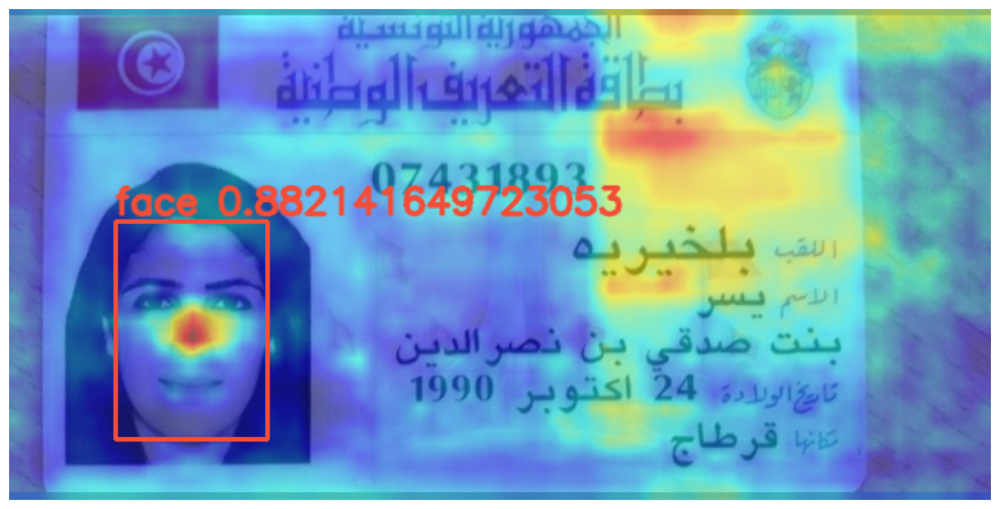

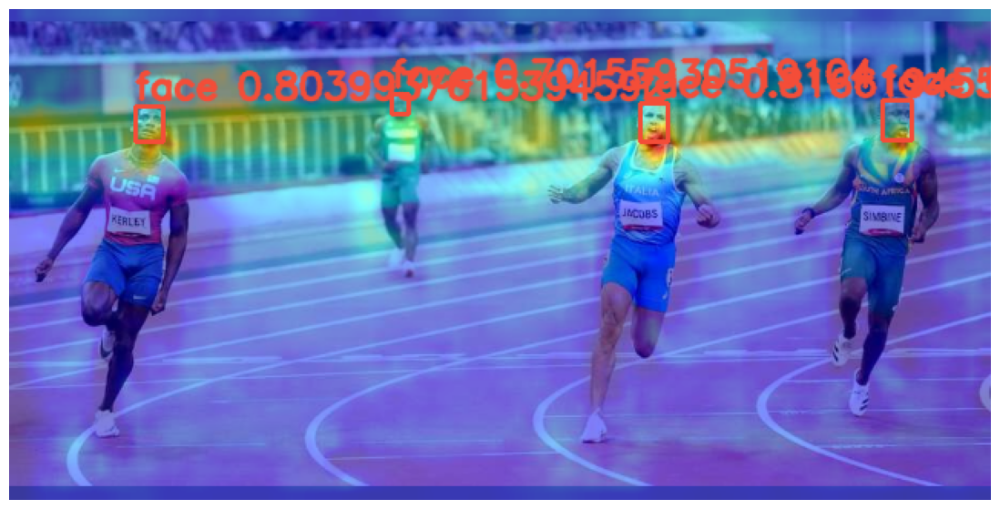

In [ ]:
# Apply the model to an image
images = model(img_path="/content/real_1008.jpg")

# Display the resulting images with heatmaps
display_images(images)
# Apply the model to an image
images = model(img_path="/content/169053377164c37f8bd24561.webp")

# Display the resulting images with heatmaps
display_images(images)
# Apply the model to an image
images = model(img_path="/content/8b4e6834-8981-4e2b-8576-c3f5e9a70242.jpg")

# Display the resulting images with heatmaps
display_images(images)
images = model(img_path="/content/top2c-460_x2.jpg")

# Display the resulting images with heatmaps
display_images(images)

#LayerCAM

In [ ]:
from YOLOv8_Explainer import yolov8_heatmap, display_images

# Initialize the model with desired parameters
model = yolov8_heatmap(
    weight="/content/facial_detection.pt",  # Path to your YOLOv8 model
    conf_threshold=0.4,                      # Confidence threshold for detections
    method="LayerCAM",                       # CAM method: 'EigenCAM', 'LayerCAM', etc.
    layer=[10, 12, 14, 16, 18, -3],          # Layers to target for CAM
    show_box=True,                           # Whether to display bounding boxes
    renormalize=False                        # Whether to renormalize the heatmap
)



Model summary: 169 layers, 25,856,899 parameters, 0 gradients, 79.1 GFLOPs


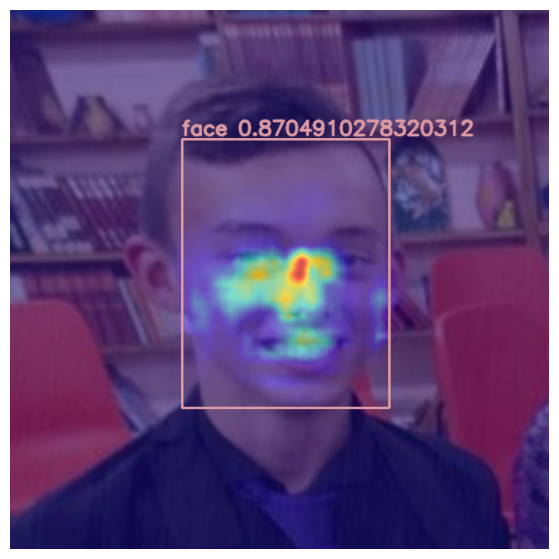

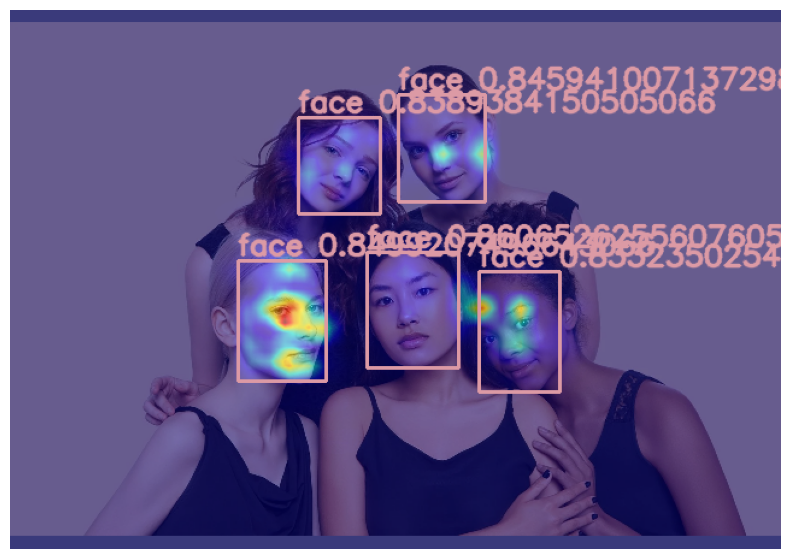

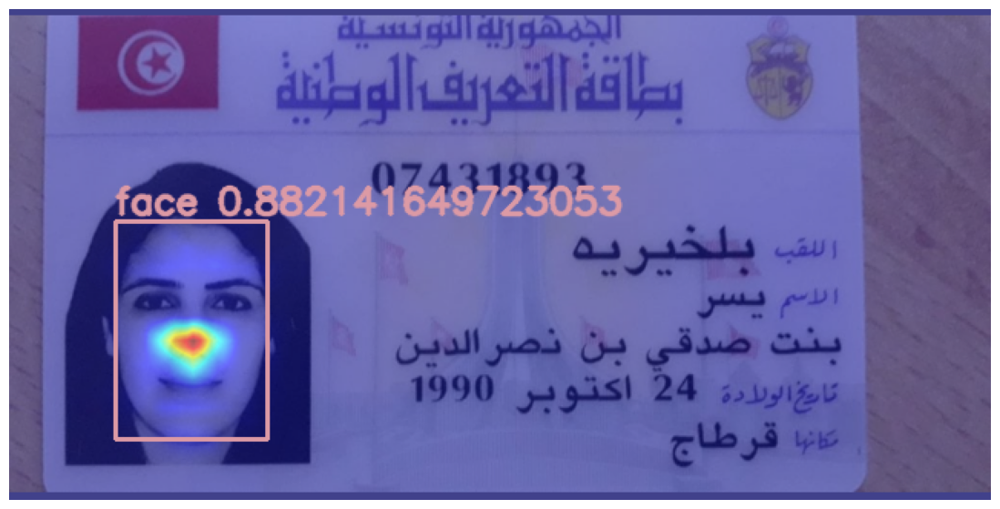

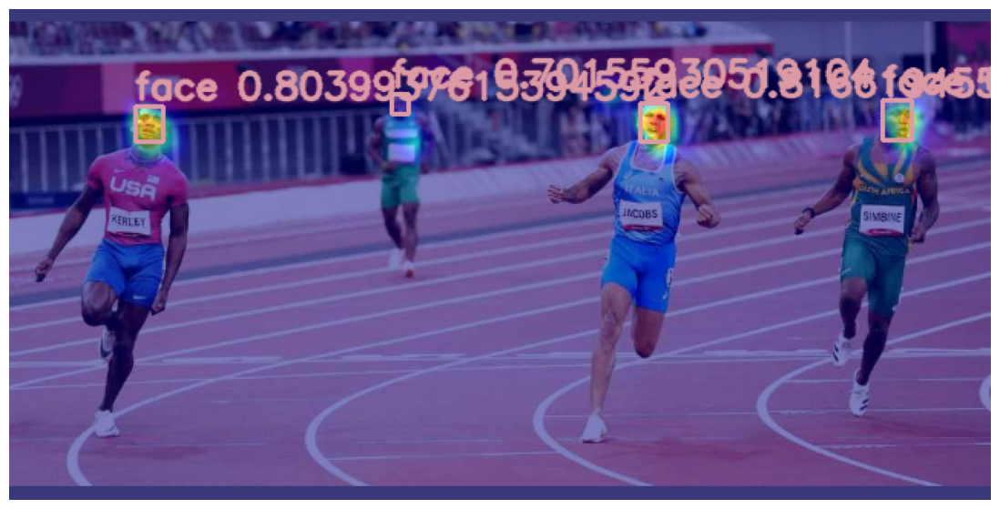

In [ ]:
# Apply the model to an image
images = model(img_path="/content/real_1008.jpg")

# Display the resulting images with heatmaps
display_images(images)
# Apply the model to an image
images = model(img_path="/content/169053377164c37f8bd24561.webp")

# Display the resulting images with heatmaps
display_images(images)
# Apply the model to an image
images = model(img_path="/content/8b4e6834-8981-4e2b-8576-c3f5e9a70242.jpg")

# Display the resulting images with heatmaps
display_images(images)
images = model(img_path="/content/top2c-460_x2.jpg")

# Display the resulting images with heatmaps
display_images(images)